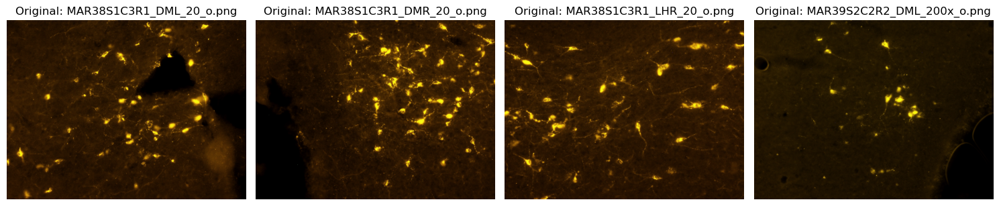

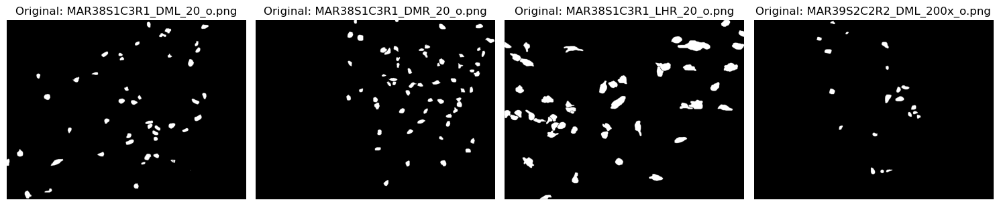

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageFilter, ImageEnhance 
import os 

IMAGES_PATH = r'.\Data\tugas3\ori'
MASKS_PATH = r'.\Data\tugas3\mask'
OUTPUT_PATH = r'.\Data\tugas3\output'

def showImagesInTable(image_list, titles=None, rows= 1, cols=4, figsize=(15, 5)):
    """
    Display a list of images in a table format 
    """
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    if rows == 1:
        axes = [axes] if cols == 1 else axes
    else:
        axes = axes.flatten()
        
    for idx, (img, title) in enumerate(zip(image_list, titles)):
        if idx >= rows * cols:
            break
            
        if isinstance(img, Image.Image):
            img = np.array(img)
        
        
        if len(img.shape) == 3 and img.shape[2] == 3:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        
        axes[idx].imshow(img, cmap='gray' if len(img.shape) == 2 else None)
        axes[idx].set_title(title)
        axes[idx].axis('off')
    
    
    for idx in range(len(image_list), rows * cols):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()


ORI_IMAGES = []
ORI_TITLES = []
MASK_PATHS = []
MASK_TITLES = []

def ImportImages(IMAGES_PATH, ORI_IMAGES, ORI_TITLES):
    images = [f for f in os.listdir(IMAGES_PATH) if f.endswith('.png')]
    for idx, filename in enumerate(images):
        path = os.path.join(IMAGES_PATH,filename)
        img_cv = cv2.imread(path)
    
        ORI_IMAGES.append(img_cv)
        ORI_TITLES.append(f"Original: {filename}")

ImportImages(IMAGES_PATH, ORI_IMAGES, ORI_TITLES)
ImportImages(MASKS_PATH, MASK_PATHS, MASK_TITLES)


showImagesInTable(ORI_IMAGES, ORI_TITLES, rows=1, cols=4, figsize=(15, 5))
showImagesInTable(MASK_PATHS, MASK_TITLES, rows=1, cols=4, figsize=(15, 5))

In [2]:
def toGrayScale(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

def blueImage(image,r):
    return image.filter(ImageFilter.GaussianBlur(radius= r))

def constrastImage(image, f):
    enhancer = ImageEnhance.Contrast(image)
    return enhancer.enhance(f)

def toArray(image):
    return np.array(image)

def OtsuThresholding(image):
   
    if len(image.shape) == 3:
        image = toGrayScale(image)
    
    img = image.astype(np.uint8)
    total = img.size

    
    hist = np.bincount(img.flatten(), minlength=256)
    prob = hist / total

    
    omega = np.cumsum(prob)                  
    mu = np.cumsum(np.arange(256) * prob)    
    mu_total = mu[-1]

    numerator = (mu_total * omega - mu) ** 2
    denominator = omega * (1.0 - omega)

    with np.errstate(divide='ignore', invalid='ignore'):
        sigma_b = numerator / denominator
    sigma_b[denominator == 0] = 0

    best_t = int(np.argmax(sigma_b))

    otsu_res = np.where(img >= best_t, 255, 0).astype(np.uint8)
    return best_t, otsu_res


def BilateralFilter(image, d, sigmaColor=75, sigmaSpace=75):
    return cv2.bilateralFilter(image, d, sigmaColor, sigmaSpace)

def medianFilter(image, kernel_size=5):
    return cv2.medianBlur(image, ksize=kernel_size)

def findContours(image, otsu_value):
    return cv2.findContours(image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

In [3]:
# MORPHOLOGICAL OPERATIONS

def erosion(image, kernel_size = 3, iterations = 1):
    """
    Manual implementation erosion
    """
    
    if len(image.shape) == 3:
        image = toGrayScale(image)
    
    if (iterations > 1):
        for _ in range(iterations - 1):
            image = erosion(image, kernel_size, iterations=1)
    
    height, width = image.shape
    k_width, k_height = kernel_size, kernel_size
    pad_h , pad_w = k_height // 2, k_width // 2 # will auto floor for odd nubmer
    
    padded = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant', constant_values=0)
    result = np.zeros_like(image)
    
    for i in range(height):
        for j in range(width):
            region = padded [i:i + k_height, j:j + k_width] #take patch from the padded 
            if np.all(region == 255):
                result[i, j] = 255
            else:
                result[i, j] = 0

                
    return result 

def dilation(image, kernel_size = 3, iterations = 1):
    if len(image.shape) == 3:
        image = toGrayScale(image)
        
        if(iterations > 1):
            for _ in range(iterations -1 ):
                image = dilation(image, kernel_size, iterations=1)
                
    height, width = image.shape
    k_width, k_height = kernel_size, kernel_size
    pad_h , pad_w = k_height // 2, k_width // 2
    
    padded = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant', constant_values=0)
    result = np.zeros_like(image) 
    
    for i in range(height):
        for j in range(width):
            region = padded[i:i+ k_height, j: j+ k_width]
            if np.any(region == 255):
                result[i, j] = 255
            else:
                result[i, j] = 0

                
    return result

def opening(image, kernel_size = 3):
    return  dilation(erosion(image, kernel_size), kernel_size)
    

def closing(image, kernel_size = 3):
    return erosion(dilation(image, kernel_size), kernel_size)

def morphologicalGradient(image, kernel_size = 3):
    dilated = dilation(image, kernel_size)
    eroded = erosion(image, kernel_size)
    gradient = cv2.subtract(dilated, eroded)
    return gradient
    

In [4]:
def hit_and_miss(image, kernel_hit, kernel_miss):
    # kernel miss structuring element for background
    # kernel hit structuring element for foreground
    
    if len(image.shape) == 3:
        image = toGrayScale(image)
        
    binary = (image > 127).astype(np.uint8) * 255
    
    height, width = image.shape
    k_width, k_height = kernel_hit.shape[1], kernel_hit.shape[0]
    pad_h , pad_w = k_height // 2, k_width // 2
    
    padded = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant', constant_values=0)
    result = np.zeros_like(image) 
    
    for i in range (height):
        for j in range(width):
            region = padded[i:i + k_height, j:j + k_width]
            hit_condition = True
            for ki in range(k_height):
                for kj in range(k_width):
                    if kernel_hit[ki, kj] == 1:
                        if region[ki, kj] != 1:
                            hit_condition = False
                            break
                if not hit_condition:
                    break
            
           
            miss_condition = True
            for ki in range(k_height):
                for kj in range(k_width):
                    if kernel_miss[ki, kj] == 1:
                        if region[ki, kj] != 0:
                            miss_condition = False
                            break
                if not miss_condition:
                    break
            
       
            if hit_condition and miss_condition:
                result[i, j] = 1
            else:
                result[i, j] = 0
    
    return (result * 255).astype(np.uint8)

def thinning(image, max_iterations = 100):
    binary = (image > 127).astype(np.uint8) * 255
    
    kernels = [
        np.array([[0, 0, 0],
                  [2, 1, 2],
                  [1, 1, 1]], dtype=np.int8),
        
        np.array([[2, 0, 0],
                  [1, 1, 0],
                  [2, 1, 2]], dtype=np.int8),
        
        np.array([[1, 2, 0],
                  [1, 1, 0],
                  [1, 2, 0]], dtype=np.int8),
        
        np.array([[2, 1, 2],
                  [1, 1, 0],
                  [2, 0, 0]], dtype=np.int8),
        
        np.array([[1, 1, 1],
                  [2, 1, 2],
                  [0, 0, 0]], dtype=np.int8),
        
        np.array([[2, 1, 2],
                  [0, 1, 1],
                  [0, 0, 2]], dtype=np.int8),
        
        np.array([[0, 2, 1],
                  [0, 1, 1],
                  [0, 2, 1]], dtype=np.int8),
        
        np.array([[0, 0, 2],
                  [0, 1, 1],
                  [2, 1, 2]], dtype=np.int8),
    ]
    result = binary.copy()
    
    for iteration in range(max_iterations):
        pre = result.copy()
        
        for kernel in kernels:
            kernel_converted = kernel.copy()
            kernel_converted[kernel == 1] = 255
            
            hmt = hit_and_miss(result, kernel_converted)
            result = result -  (hmt > 0).astype(np.uint8) * 255
            
        if np.array_equal(result, pre):
            print(f'Thinnging converged after {iteration} iterations.')
            break
    
    return result

def detect_endpoints(image):

    if len(image.shape) == 3:
        image = toGrayScale(image)
    
    # Endpoint kernels (8 orientations)
    endpoint_kernels = [
        np.array([[ 0, 0, 0],
                  [-1, 1,-1],
                  [-1,-1,-1]], dtype=np.int8),
        
        np.array([[-1, 0, 0],
                  [-1, 1, 0],
                  [-1,-1,-1]], dtype=np.int8),
        
        np.array([[-1,-1, 0],
                  [-1, 1, 0],
                  [-1,-1, 0]], dtype=np.int8),
        
        np.array([[-1,-1,-1],
                  [-1, 1, 0],
                  [-1, 0, 0]], dtype=np.int8),
        
        np.array([[-1,-1,-1],
                  [-1, 1,-1],
                  [ 0, 0, 0]], dtype=np.int8),
        
        np.array([[-1,-1,-1],
                  [ 0, 1,-1],
                  [ 0, 0,-1]], dtype=np.int8),
        
        np.array([[ 0,-1,-1],
                  [ 0, 1,-1],
                  [ 0,-1,-1]], dtype=np.int8),
        
        np.array([[ 0, 0,-1],
                  [ 0, 1,-1],
                  [-1,-1,-1]], dtype=np.int8),
    ]
    
    result = np.zeros_like(image)
    
    for kernel in endpoint_kernels:
        endpoints = hit_and_miss(image, kernel)
        result = np.maximum(result, endpoints)
    
    return result

def detect_corners(image):
    """
    Detect corners using Hit-and-Miss
    """
    if len(image.shape) == 3:
        image = toGrayScale(image)
    
    # Corner kernels (4 orientations)
    corner_kernels = [
        # Top-left corner
        np.array([[-1, -1, -1],
                  [-1,  1,  0],
                  [-1,  0,  0]], dtype=np.int8),
        
        # Top-right corner
        np.array([[-1, -1, -1],
                  [ 0,  1, -1],
                  [ 0,  0, -1]], dtype=np.int8),
        
        # Bottom-left corner
        np.array([[-1,  0,  0],
                  [-1,  1,  0],
                  [-1, -1, -1]], dtype=np.int8),
        
        # Bottom-right corner
        np.array([[ 0,  0, -1],
                  [ 0,  1, -1],
                  [-1, -1, -1]], dtype=np.int8),
    ]
    
    result = np.zeros_like(image)
    
    for kernel in corner_kernels:
        corners = hit_and_miss(image, kernel)
        result = np.maximum(result, corners)
    
    return result


RUNNING PIPELINE FOR ALL IMAGES (Sequential Mode)


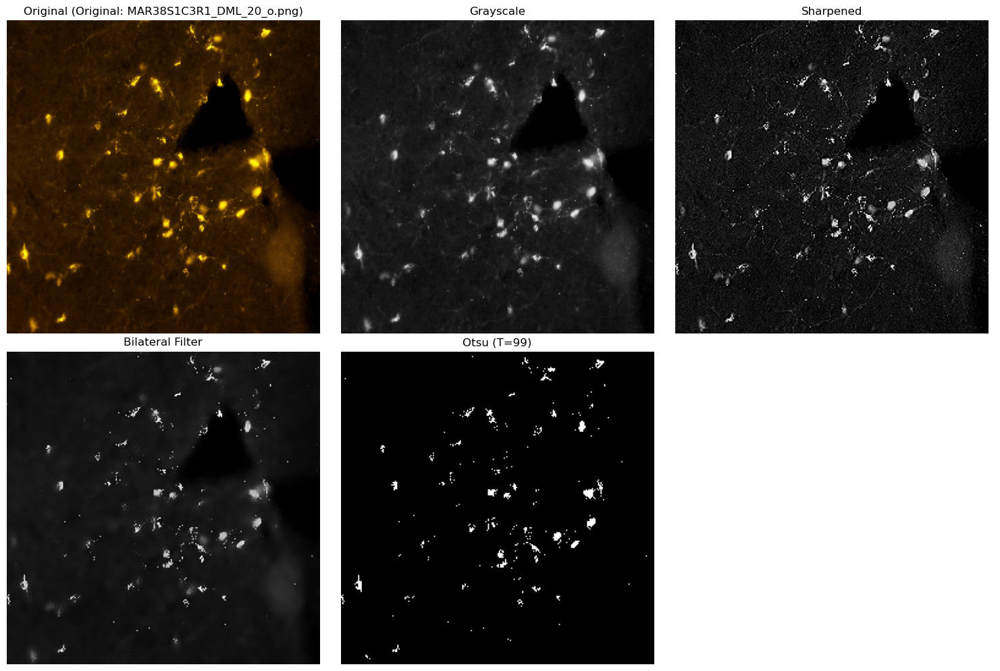

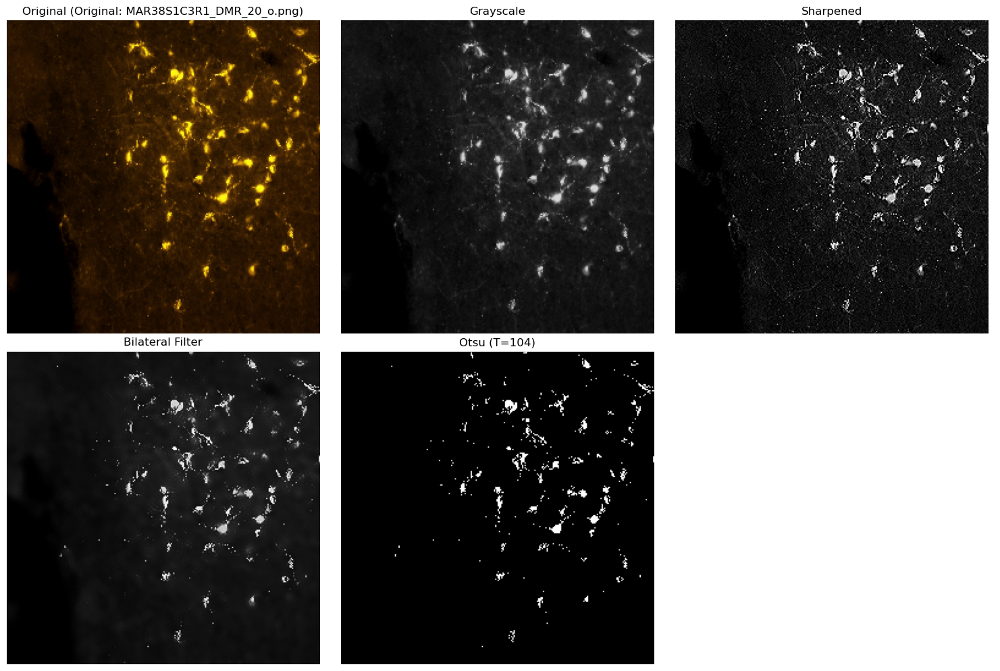

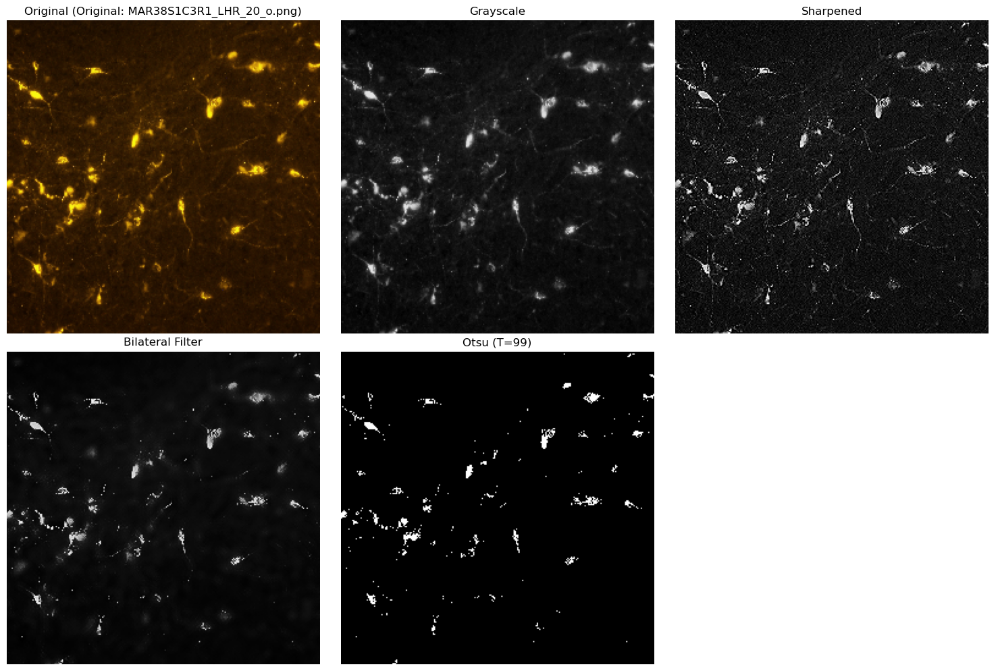

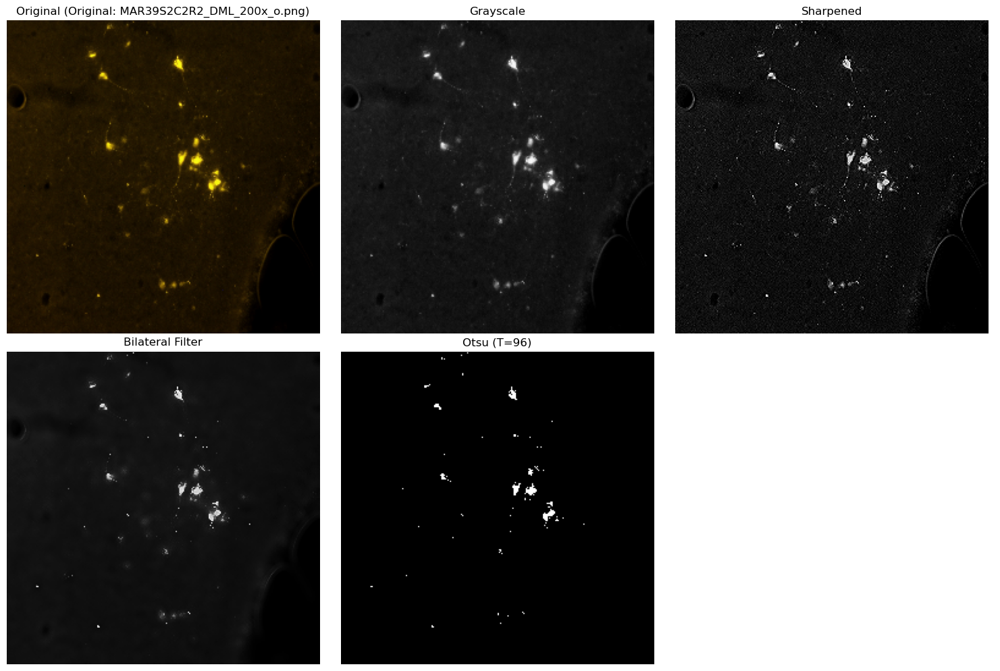

In [12]:
print("="*60)
print("RUNNING PIPELINE FOR ALL IMAGES (Sequential Mode)")
print("="*60)

def resize_image(images, target_size= (300,300)):
    resized_list = []
    for idx, img in enumerate(images):
        if isinstance(img,Image.Image):
            img = np.array(img)
            
        resized_image = cv2.resize(img,target_size, interpolation=cv2.INTER_CUBIC)
        resized_list.append(resized_image)
    return resized_list

TARGET_SIZE = (256, 256)
ORI_IMAGES_SIZED = resize_image(ORI_IMAGES, target_size=TARGET_SIZE)
MASK_PATHS_SIZED = resize_image(MASK_PATHS, target_size=TARGET_SIZE)
BINARY_RESULTS = []

for idx, image in enumerate(ORI_IMAGES_SIZED):
    
    gray = toGrayScale(image)
    
    # Sharpen using a custom kernel (cv2 has no cv2.sharpen)
    kernel_sharpen = np.array([[0, -1,  0],
                               [-1, 5, -1],
                               [0, -1,  0]])
    sharpen = cv2.filter2D(gray, -1, kernel_sharpen)
    
    filtered = BilateralFilter(sharpen, d=9)
    
    threshold_t , binary = OtsuThresholding(filtered)
    
    BINARY_RESULTS.append({
    'binary': binary,
    'threshold': threshold_t
})
    # dilated = dilation(binary, kernel_size=3, iterations=1)
    # # Call the opening function with the original binary image, not the dilated one
    # opened_img = opening(binary, kernel_size=3)
    
    
    showImagesInTable(
        [image, gray, sharpen, filtered, binary],
        [
            f'Original ({ORI_TITLES[idx]})',
            'Grayscale',
            'Sharpened',
            'Bilateral Filter',
            f'Otsu (T={threshold_t})',
           
        ],
        rows=2, cols=3, figsize=(15, 10)
    )


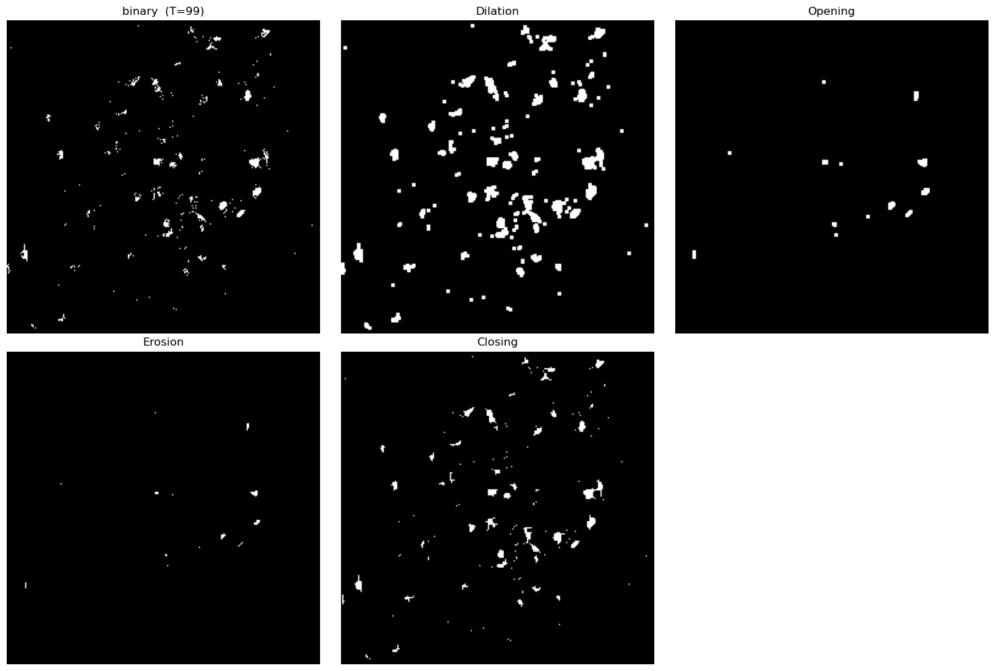

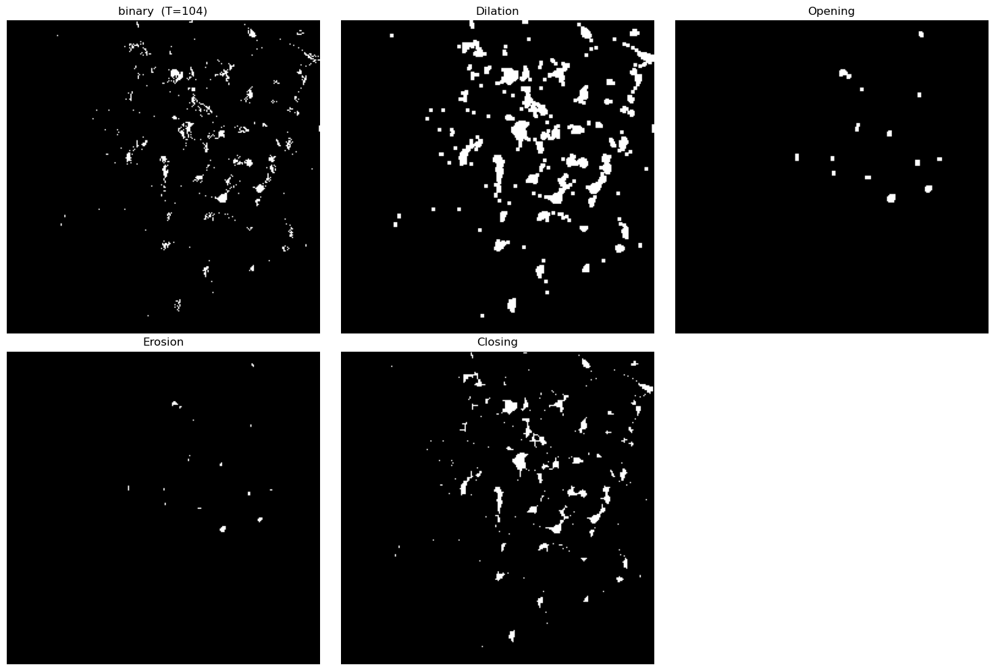

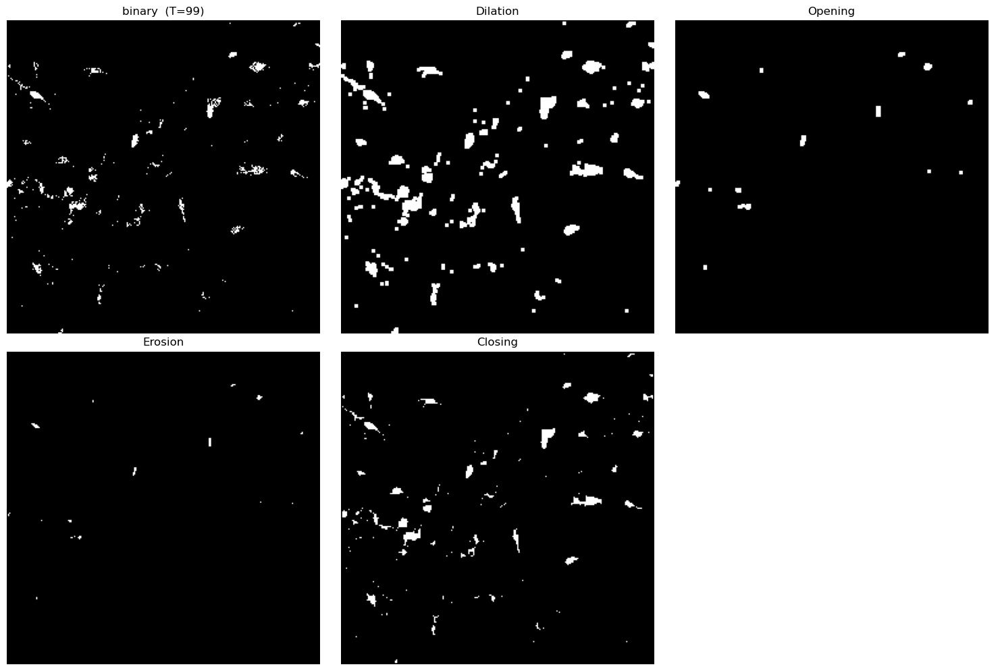

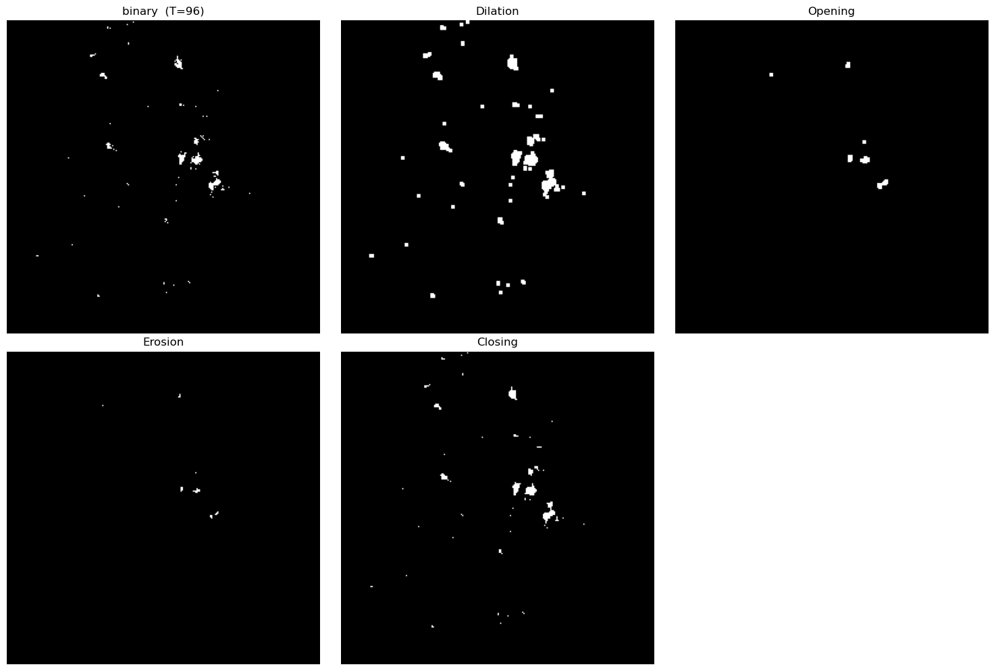

In [18]:
for idx, image in enumerate(ORI_IMAGES_SIZED):
    result = BINARY_RESULTS[idx]
    binary = result['binary']
    threshold = result['threshold']
    
    dilated = dilation(binary, kernel_size=3, iterations=1)
    opened_img = opening(binary, kernel_size=3)
    erosion_img = erosion(binary, kernel_size=3)
    closing_img = closing(binary, kernel_size=3)
    
    showImagesInTable(
        [ binary,dilated, opened_img, erosion_img, closing_img],
        [
            f'binary  (T={threshold})',
            'Dilation',
            'Opening',
            'Erosion',
            'Closing'
        ],
        rows=2, cols=3, figsize=(15, 10)
    )

====================================================
HASIL DARI SEGMENTASI YANG DILAKUKAN MORPHOLOGICAL OPERATION TERHADAP SEL NEURON OTAK TIKUS

CONTOUR DETECTION & COMPARISON WITH GROUND TRUTH


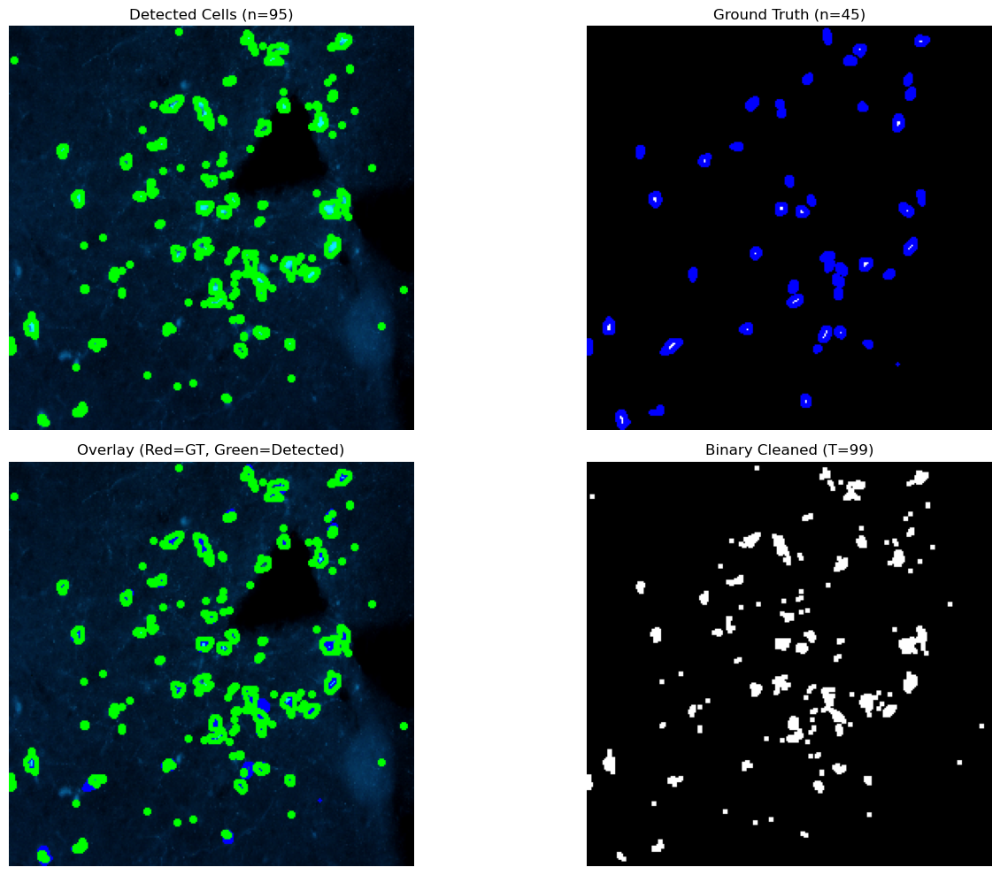


Image 1 (Original: MAR38S1C3R1_DML_20_o.png):
  - Detected cells (Otsu + Morphology): 95
  - Ground truth cells (Mask):          45
  - Difference:                         50
  - Accuracy estimate:                  47.37%
------------------------------------------------------------


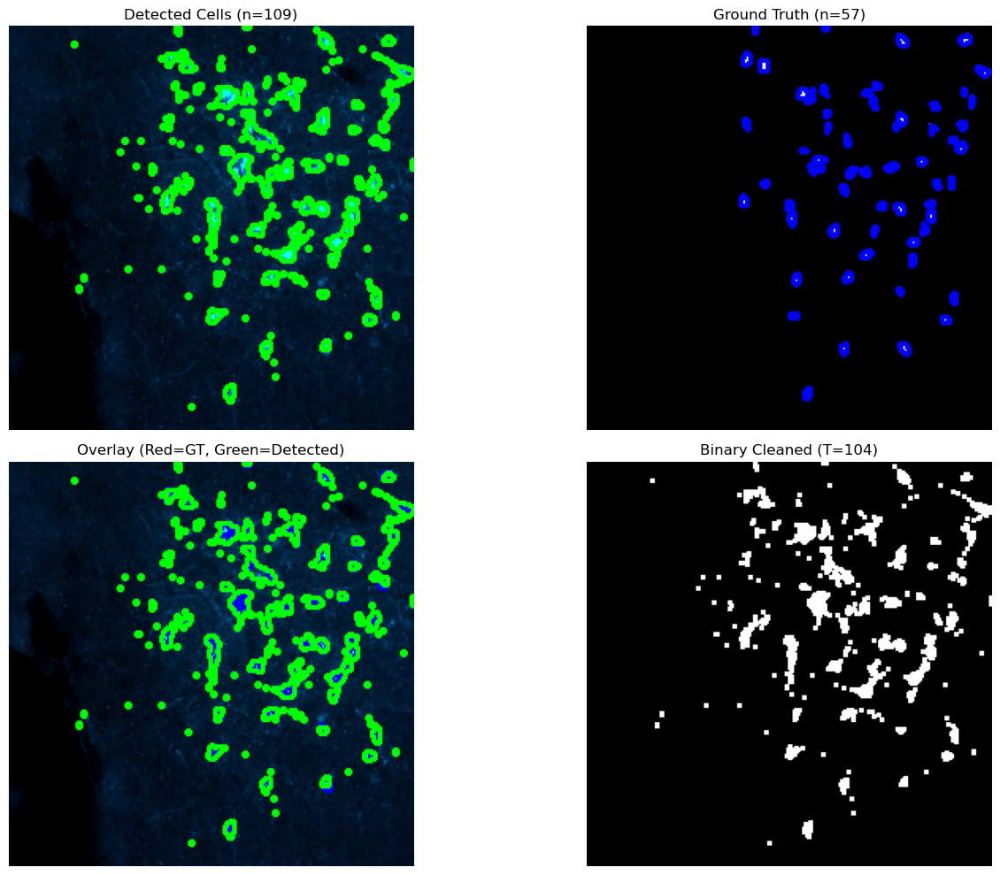


Image 2 (Original: MAR38S1C3R1_DMR_20_o.png):
  - Detected cells (Otsu + Morphology): 109
  - Ground truth cells (Mask):          57
  - Difference:                         52
  - Accuracy estimate:                  52.29%
------------------------------------------------------------


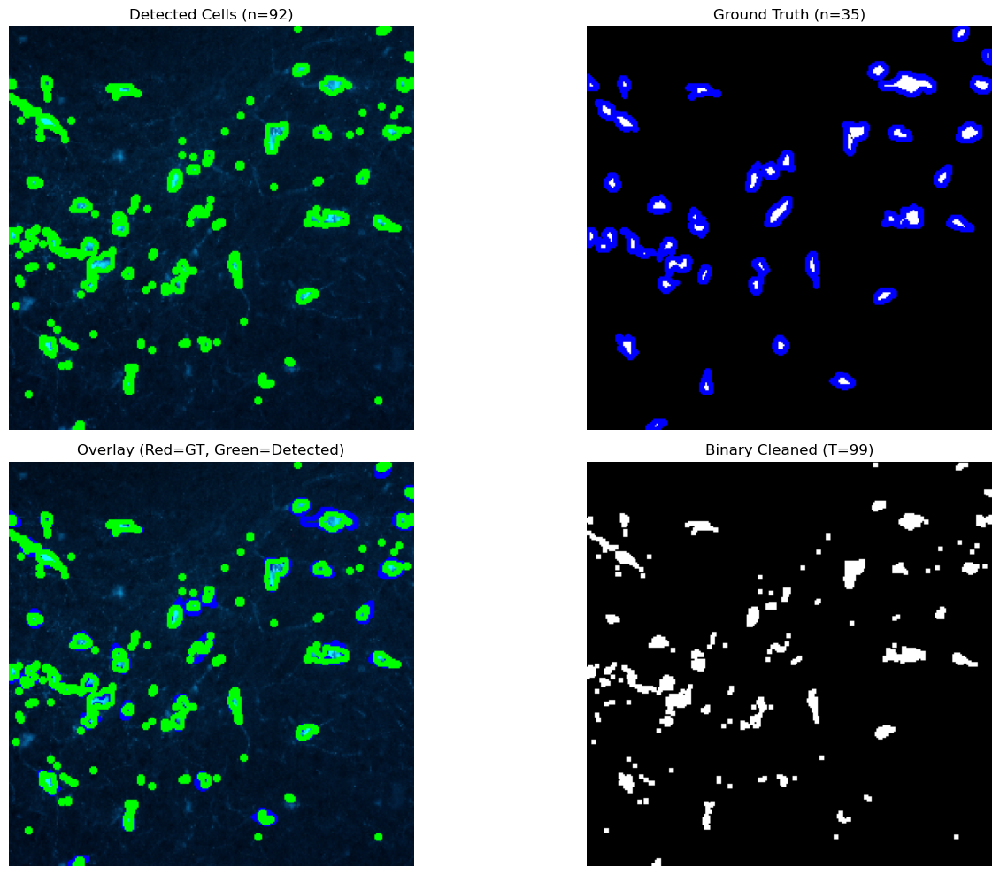


Image 3 (Original: MAR38S1C3R1_LHR_20_o.png):
  - Detected cells (Otsu + Morphology): 92
  - Ground truth cells (Mask):          35
  - Difference:                         57
  - Accuracy estimate:                  38.04%
------------------------------------------------------------


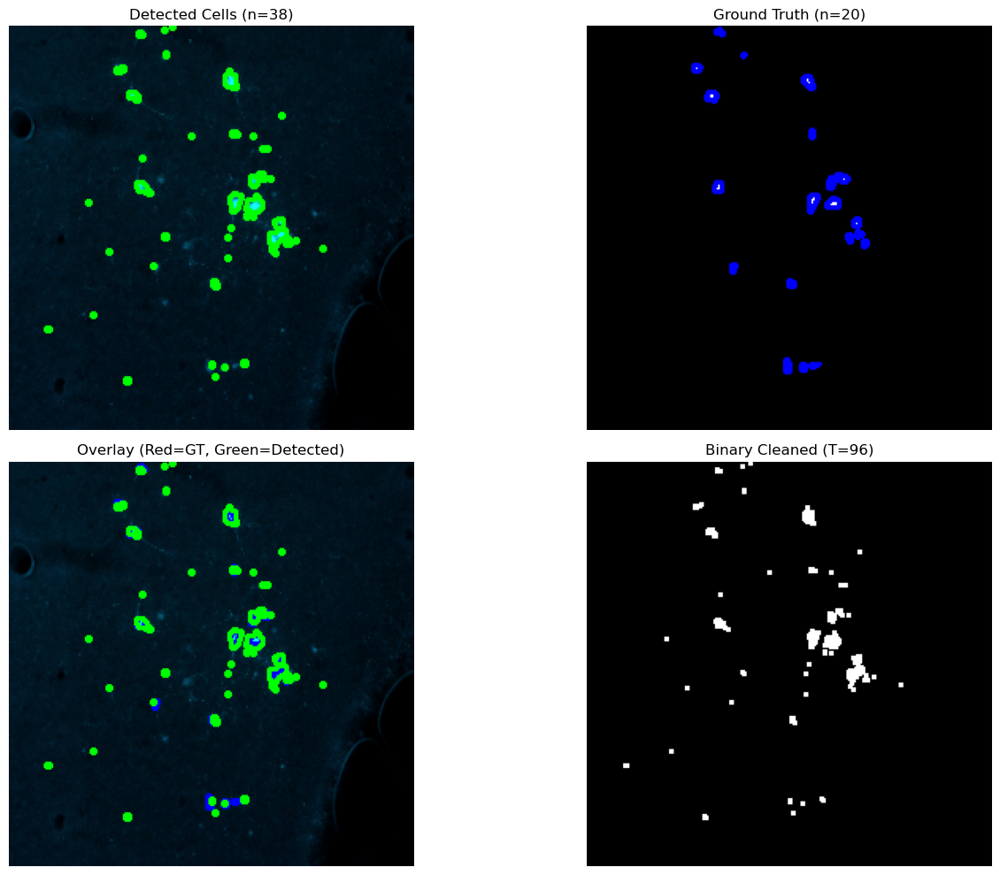


Image 4 (Original: MAR39S2C2R2_DML_200x_o.png):
  - Detected cells (Otsu + Morphology): 38
  - Ground truth cells (Mask):          20
  - Difference:                         18
  - Accuracy estimate:                  52.63%
------------------------------------------------------------

✅ Contour detection & comparison completed!


In [25]:
# ========== CELL BARU: CONTOUR DETECTION & COMPARISON WITH GT ==========

print("="*60)
print("CONTOUR DETECTION & COMPARISON WITH GROUND TRUTH")
print("="*60)
MIN_AREA = 50

for idx, image in enumerate(ORI_IMAGES_SIZED):
    # Get binary result dari preprocessing
    result = BINARY_RESULTS[idx]
    binary = result['binary']
    threshold = result['threshold']
    
    
    
    # UBAH DISINIIIIIII
    cleaned = dilation(binary, kernel_size=3)
    
    
    
    # --- Contour detection dari hasil Otsu ---
    contours_otsu, _ = cv2.findContours(
        cleaned, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
    )
    
    # Gambar kontur di original image
    ori_with_contour = image.copy()
    if len(ori_with_contour.shape) == 3:
        ori_with_contour = cv2.cvtColor(ori_with_contour, cv2.COLOR_BGR2RGB)
    else:
        ori_with_contour = cv2.cvtColor(ori_with_contour, cv2.COLOR_GRAY2RGB)
    
    cv2.drawContours(ori_with_contour, contours_otsu, -1, (0, 255, 0), 2)  # Green
    
    # --- Contour detection dari Mask Ground Truth ---
    mask = MASK_PATHS_SIZED[idx]
    if len(mask.shape) == 3:
        mask_gray = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
    else:
        mask_gray = mask
    
    # Binarize mask (pastikan 0 dan 255)
    _, mask_binary = cv2.threshold(mask_gray, 127, 255, cv2.THRESH_BINARY)
    
    contours_mask, _ = cv2.findContours(
        mask_binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
    )
    
    # Gambar kontur GT di mask
    mask_with_contour = cv2.cvtColor(mask_gray, cv2.COLOR_GRAY2RGB)
    cv2.drawContours(mask_with_contour, contours_mask, -1, (255, 0, 0), 2)  # Red
    
    # --- Overlay: GT (red) vs Detected (green) ---
    overlay = image.copy()
    if len(overlay.shape) == 3:
        overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    else:
        overlay = cv2.cvtColor(overlay, cv2.COLOR_GRAY2RGB)
    
    cv2.drawContours(overlay, contours_mask, -1, (255, 0, 0), 2)    # Red = GT
    cv2.drawContours(overlay, contours_otsu, -1, (0, 255, 0), 2)    # Green = Detected
    
    # Display results
    showImagesInTable(
        [ori_with_contour, mask_with_contour, overlay, cleaned],
        [
            f'Detected Cells (n={len(contours_otsu)})',
            f'Ground Truth (n={len(contours_mask)})',
            'Overlay (Red=GT, Green=Detected)',
            f'Binary Cleaned (T={threshold})'
        ],
        rows=2, cols=2, figsize=(15, 10)
    )
    
    # Print statistics
    print(f"\nImage {idx+1} ({ORI_TITLES[idx]}):")
    print(f"  - Detected cells (Otsu + Morphology): {len(contours_otsu)}")
    print(f"  - Ground truth cells (Mask):          {len(contours_mask)}")
    print(f"  - Difference:                         {abs(len(contours_otsu) - len(contours_mask))}")
    print(f"  - Accuracy estimate:                  {min(len(contours_otsu), len(contours_mask)) / max(len(contours_otsu), len(contours_mask)) * 100:.2f}%")
    print("-" * 60)

print("\n✅ Contour detection & comparison completed!")

In [39]:
# ========== CELL BARU: DEFINISI MODEL U-NET ==========
import torch
import torch.nn as nn

class UNet(nn.Module):
    def __init__(self):
        super(UNet, self).__init__()
        
        # Encoder
        self.enc1 = self.conv_block(1, 64)
        self.enc2 = self.conv_block(64, 128)
        self.enc3 = self.conv_block(128, 256)
        self.enc4 = self.conv_block(256, 512)
        
        # Bottleneck
        self.bottleneck = self.conv_block(512, 1024)
        
        # Decoder - PERBAIKAN: concat channels harus sesuai
        self.upconv4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = self.conv_block(1024, 512)  # 512 dari upconv + 512 dari enc4 = 1024
        
        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = self.conv_block(512, 256)   # 256 dari upconv + 256 dari enc3 = 512
        
        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = self.conv_block(256, 128)   # 128 dari upconv + 128 dari enc2 = 256
        
        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = self.conv_block(128, 64)    # 64 dari upconv + 64 dari enc1 = 128
        
        # Final output layer
        self.final = nn.Conv2d(64, 1, kernel_size=1)
        
        # Max pooling
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        # Encoder
        enc1 = self.enc1(x)           # (B, 64, H, W)
        enc2 = self.enc2(self.pool(enc1))  # (B, 128, H/2, W/2)
        enc3 = self.enc3(self.pool(enc2))  # (B, 256, H/4, W/4)
        enc4 = self.enc4(self.pool(enc3))  # (B, 512, H/8, W/8)
        
        # Bottleneck
        bottleneck = self.bottleneck(self.pool(enc4))  # (B, 1024, H/16, W/16)
        
        # Decoder with skip connections
        dec4 = self.upconv4(bottleneck)          # (B, 512, H/8, W/8)
        dec4 = torch.cat((dec4, enc4), dim=1)    # (B, 1024, H/8, W/8)
        dec4 = self.dec4(dec4)                   # (B, 512, H/8, W/8)
        
        dec3 = self.upconv3(dec4)                # (B, 256, H/4, W/4)
        dec3 = torch.cat((dec3, enc3), dim=1)    # (B, 512, H/4, W/4)
        dec3 = self.dec3(dec3)                   # (B, 256, H/4, W/4)
        
        dec2 = self.upconv2(dec3)                # (B, 128, H/2, W/2)
        dec2 = torch.cat((dec2, enc2), dim=1)    # (B, 256, H/2, W/2)
        dec2 = self.dec2(dec2)                   # (B, 128, H/2, W/2)
        
        dec1 = self.upconv1(dec2)                # (B, 64, H, W)
        dec1 = torch.cat((dec1, enc1), dim=1)    # (B, 128, H, W)
        dec1 = self.dec1(dec1)                   # (B, 64, H, W)
        
        # Final output
        return self.final(dec1)                  # (B, 1, H, W)


Training on device: cuda
Dataset size: 4
Batch size: 4
Epoch [1/200], Avg Loss: 0.675650
Epoch [1/200], Avg Loss: 0.675650
Epoch [10/200], Avg Loss: 0.133850
Epoch [10/200], Avg Loss: 0.133850
Epoch [20/200], Avg Loss: 0.056905
Epoch [20/200], Avg Loss: 0.056905
Epoch [30/200], Avg Loss: 0.061343
Epoch [30/200], Avg Loss: 0.061343
Epoch [40/200], Avg Loss: 0.057630
Epoch [40/200], Avg Loss: 0.057630
Epoch [50/200], Avg Loss: 0.055826
Epoch [50/200], Avg Loss: 0.055826
Epoch [60/200], Avg Loss: 0.054032
Epoch [60/200], Avg Loss: 0.054032
Epoch [70/200], Avg Loss: 0.052575
Epoch [70/200], Avg Loss: 0.052575
Epoch [80/200], Avg Loss: 0.051814
Epoch [80/200], Avg Loss: 0.051814
Epoch [90/200], Avg Loss: 0.050979
Epoch [90/200], Avg Loss: 0.050979
Epoch [100/200], Avg Loss: 0.049306
Epoch [100/200], Avg Loss: 0.049306
Epoch [110/200], Avg Loss: 0.047026
Epoch [110/200], Avg Loss: 0.047026
Epoch [120/200], Avg Loss: 0.045378
Epoch [120/200], Avg Loss: 0.045378
Epoch [130/200], Avg Loss: 0.05

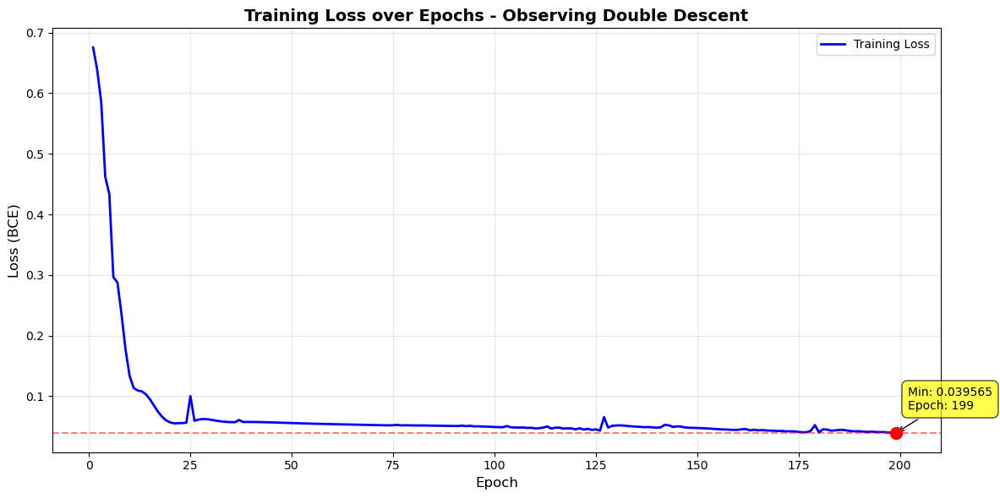


Training Statistics:
  - Total Epochs: 200
  - Initial Loss: 0.675650
  - Final Loss: 0.039660
  - Min Loss: 0.039565 at Epoch 199
  - Loss Reduction: 94.13%

⚠️ Potential Double Descent Pattern Detected!
  - Early phase min: 0.049306
  - Middle phase max: 0.065612 at epoch 127
  - Late phase min: 0.039565


In [43]:
# ========== CELL BARU: TRAINING U-NET ==========
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
# NOTE: cv2 and numpy (np) are already imported in a previous cell, don't re-import them here.

# Dataset class untuk memuat gambar dan mask
class CellDataset(Dataset):
    def __init__(self, images, masks, transform=None):
        self.images = images
        self.masks = masks
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        mask = self.masks[idx]

        # Ensure image is grayscale and normalize
        if isinstance(image, np.ndarray) and image.ndim == 3:
            # If image has 3 channels (BGR), convert to grayscale
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        elif isinstance(image, np.ndarray) and image.ndim == 2:
            # Already grayscale, keep as is
            pass
        else:
            image = np.array(image)
        
        # Normalize image to [0, 1]
        image = image.astype(np.float32) / 255.0
        
        # Add channel dimension for grayscale: (H, W) -> (1, H, W)
        image = np.expand_dims(image, axis=0)

        # Ensure mask is single-channel (grayscale). Masks may be loaded as BGR (H,W,3).
        if isinstance(mask, np.ndarray) and mask.ndim == 3:
            mask_gray = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
        else:
            mask_gray = mask if isinstance(mask, np.ndarray) else np.array(mask)

        # Ubah mask ke binary
        mask_bin = (mask_gray > 127).astype(np.float32)  # Binary mask (H, W)
        
        # Add channel dimension for mask: (H, W) -> (1, H, W)
        mask = np.expand_dims(mask_bin, axis=0)

        return torch.tensor(image), torch.tensor(mask)


# Preprocess binary results dengan dilation
DILATED_BINARY_RESULTS = []
for idx in range(len(BINARY_RESULTS)):
    result = BINARY_RESULTS[idx]
    binary = result['binary']
    cleaned = dilation(binary, kernel_size=3)
    DILATED_BINARY_RESULTS.append(cleaned)

# Load dataset - gunakan DILATED_BINARY_RESULTS sebagai input images
train_dataset = CellDataset(DILATED_BINARY_RESULTS, MASK_PATHS_SIZED)
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)

# Model, loss function, dan optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet().to(device)
criterion = nn.BCEWithLogitsLoss()  # Binary Cross-Entropy Loss
optimizer = optim.Adam(model.parameters(), lr=0.001)

print(f"Training on device: {device}")
print(f"Dataset size: {len(train_dataset)}")
print(f"Batch size: 4")
print("="*60)

# Training loop with loss tracking
num_epochs = 200  # Increased epochs untuk observe double descent
train_losses = []
epoch_numbers = []

for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0
    batch_count = 0

    for images, masks in train_loader:
        images, masks = images.to(device), masks.to(device)

        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, masks)

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()
        batch_count += 1
    
    # Calculate average loss for this epoch
    avg_epoch_loss = epoch_loss / batch_count
    train_losses.append(avg_epoch_loss)
    epoch_numbers.append(epoch + 1)
    
    # Print every 10 epochs
    if (epoch + 1) % 10 == 0 or epoch == 0:
        print(f"Epoch [{epoch+1}/{num_epochs}], Avg Loss: {avg_epoch_loss:.6f}")

print("\n✅ Training selesai!")

# Plot training loss curve
print("\n" + "="*60)
print("TRAINING LOSS VISUALIZATION")
print("="*60)

fig, ax = plt.subplots(1, 1, figsize=(12, 6))

# Plot loss curve
ax.plot(epoch_numbers, train_losses, 'b-', linewidth=2, label='Training Loss')
ax.set_xlabel('Epoch', fontsize=12)
ax.set_ylabel('Loss (BCE)', fontsize=12)
ax.set_title('Training Loss over Epochs - Observing Double Descent', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(fontsize=10)

# Add some annotations
min_loss = min(train_losses)
min_epoch = train_losses.index(min_loss) + 1
ax.axhline(y=min_loss, color='r', linestyle='--', alpha=0.5, label=f'Min Loss: {min_loss:.6f} @ Epoch {min_epoch}')
ax.scatter([min_epoch], [min_loss], color='red', s=100, zorder=5)
ax.annotate(f'Min: {min_loss:.6f}\nEpoch: {min_epoch}', 
            xy=(min_epoch, min_loss), 
            xytext=(10, 20), 
            textcoords='offset points',
            bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.7),
            arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0'))

plt.tight_layout()
plt.show()

# Print statistics
print(f"\nTraining Statistics:")
print(f"  - Total Epochs: {num_epochs}")
print(f"  - Initial Loss: {train_losses[0]:.6f}")
print(f"  - Final Loss: {train_losses[-1]:.6f}")
print(f"  - Min Loss: {min_loss:.6f} at Epoch {min_epoch}")
print(f"  - Loss Reduction: {((train_losses[0] - train_losses[-1]) / train_losses[0] * 100):.2f}%")

# Check for potential double descent
if len(train_losses) > 50:
    # Look for pattern: decrease -> increase -> decrease
    first_half_min = min(train_losses[:len(train_losses)//2])
    middle_max_idx = len(train_losses)//2 + np.argmax(train_losses[len(train_losses)//2:3*len(train_losses)//4])
    middle_max = train_losses[middle_max_idx]
    final_min = min(train_losses[3*len(train_losses)//4:])
    
    if middle_max > first_half_min and final_min < middle_max:
        print(f"\n⚠️ Potential Double Descent Pattern Detected!")
        print(f"  - Early phase min: {first_half_min:.6f}")
        print(f"  - Middle phase max: {middle_max:.6f} at epoch {middle_max_idx+1}")
        print(f"  - Late phase min: {final_min:.6f}")

EVALUASI DAN PERBANDINGAN: GROUND TRUTH vs U-NET PREDICTION

Memulai evaluasi...
Image 1: IoU = 0.5291, Dice = 0.6920
Image 2: IoU = 0.5557, Dice = 0.7144
Image 3: IoU = 0.5330, Dice = 0.6954
Image 4: IoU = 0.5017, Dice = 0.6681

VISUALISASI HASIL UNTUK SEMUA GAMBAR
Image 1: IoU = 0.5291, Dice = 0.6920
Image 2: IoU = 0.5557, Dice = 0.7144
Image 3: IoU = 0.5330, Dice = 0.6954
Image 4: IoU = 0.5017, Dice = 0.6681

VISUALISASI HASIL UNTUK SEMUA GAMBAR


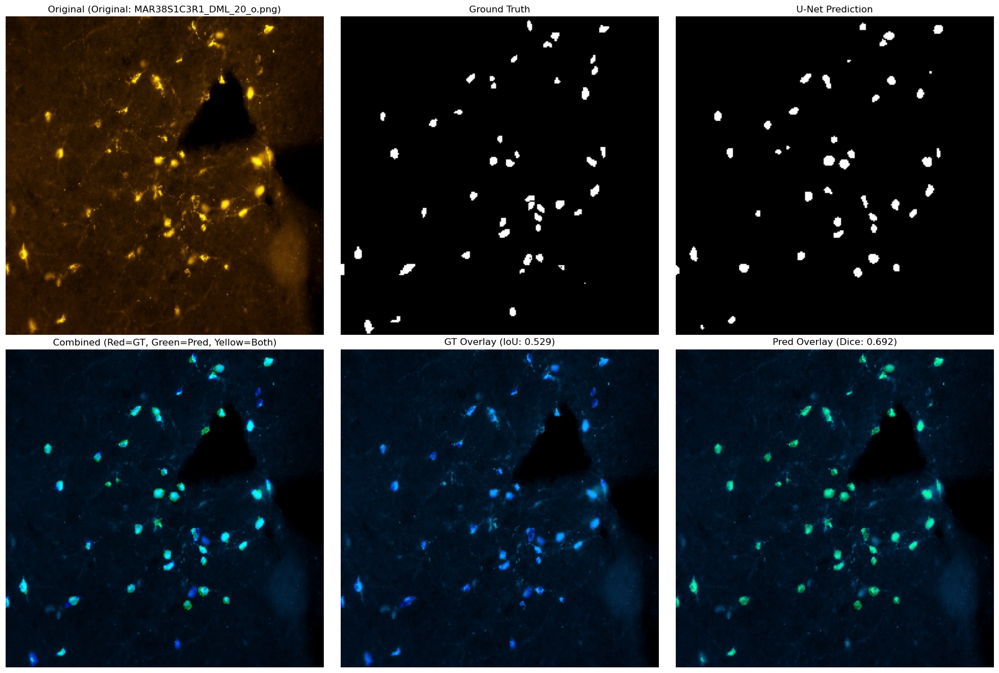

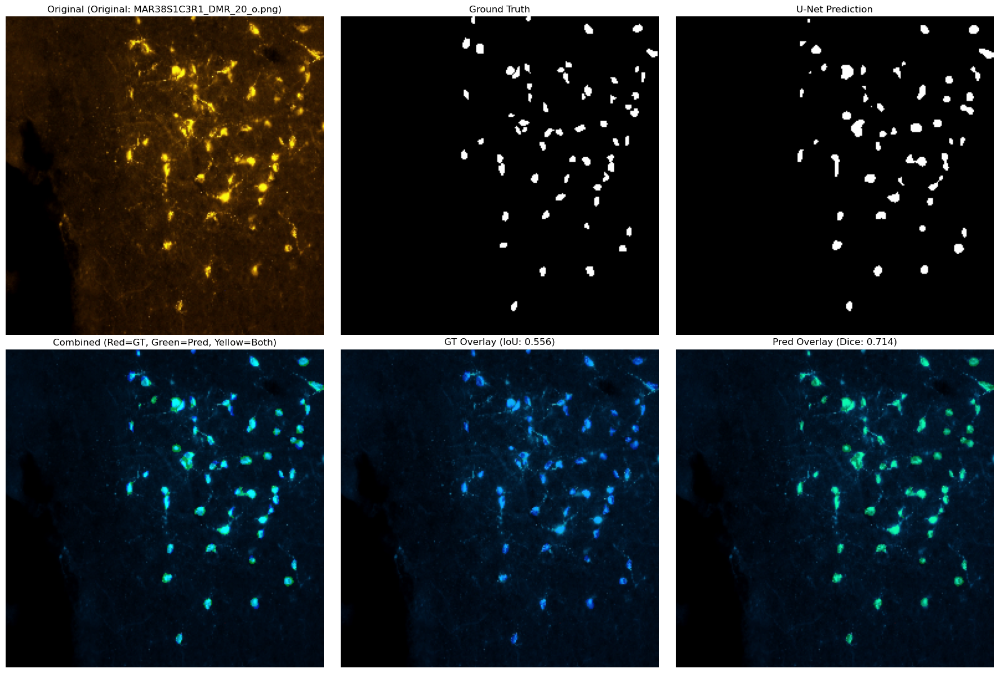

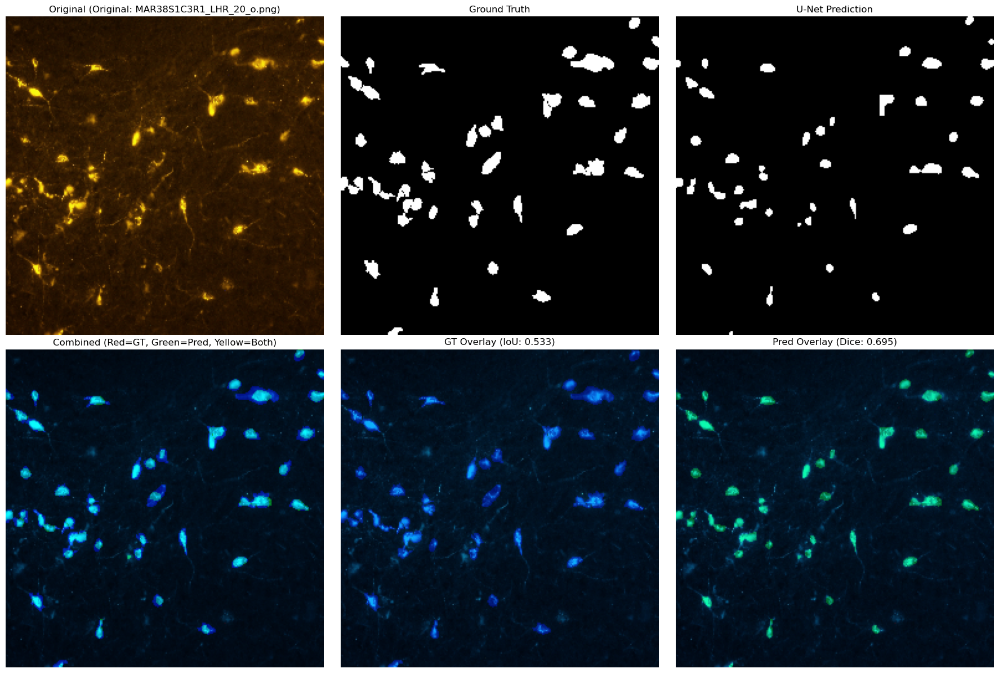

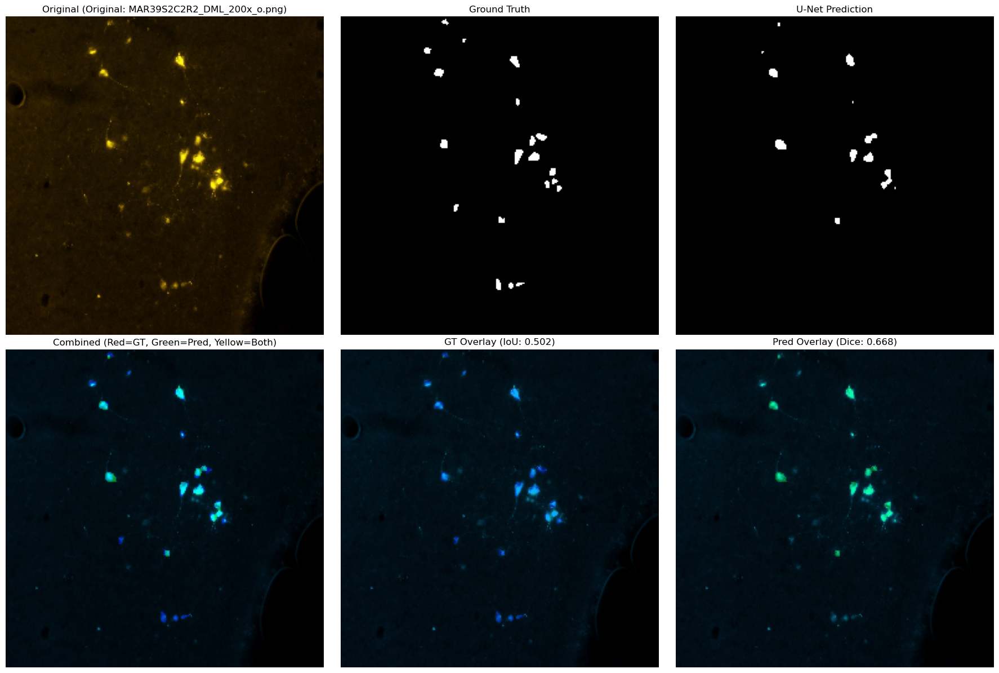


SUMMARY METRICS

Average IoU:  0.5299
Average Dice: 0.6925

Per-Image Metrics:
  Image 1: IoU = 0.5291, Dice = 0.6920
  Image 2: IoU = 0.5557, Dice = 0.7144
  Image 3: IoU = 0.5330, Dice = 0.6954
  Image 4: IoU = 0.5017, Dice = 0.6681

✅ Evaluasi selesai!


In [44]:
# ========== EVALUATION & VISUALIZATION ==========
print("="*60)
print("EVALUASI DAN PERBANDINGAN: GROUND TRUTH vs U-NET PREDICTION")
print("="*60)

# Function to calculate IoU (Intersection over Union)
def calculate_iou(pred, target, threshold=0.5):
    """
    Calculate IoU between prediction and target mask
    """
    pred_binary = (pred > threshold).astype(np.uint8)
    target_binary = (target > 0.5).astype(np.uint8)
    
    intersection = np.logical_and(pred_binary, target_binary).sum()
    union = np.logical_or(pred_binary, target_binary).sum()
    
    if union == 0:
        return 0.0
    
    iou = intersection / union
    return iou

# Function to calculate Dice coefficient
def calculate_dice(pred, target, threshold=0.5):
    """
    Calculate Dice coefficient between prediction and target mask
    """
    pred_binary = (pred > threshold).astype(np.uint8)
    target_binary = (target > 0.5).astype(np.uint8)
    
    intersection = np.logical_and(pred_binary, target_binary).sum()
    
    dice = (2.0 * intersection) / (pred_binary.sum() + target_binary.sum() + 1e-7)
    return dice

# Set model to evaluation mode
model.eval()

# Storage for results
all_predictions = []
all_ground_truths = []
all_metrics = []

print("\nMemulai evaluasi...")

with torch.no_grad():
    for idx in range(len(DILATED_BINARY_RESULTS)):
        # Get single image and mask
        image = DILATED_BINARY_RESULTS[idx]
        mask = MASK_PATHS_SIZED[idx]
        
        # Preprocess image (sama seperti di dataset)
        if isinstance(image, np.ndarray) and image.ndim == 3:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        
        image_normalized = image.astype(np.float32) / 255.0
        image_tensor = torch.tensor(image_normalized).unsqueeze(0).unsqueeze(0).to(device)  # (1, 1, H, W)
        
        # Preprocess mask
        if isinstance(mask, np.ndarray) and mask.ndim == 3:
            mask_gray = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
        else:
            mask_gray = mask
        
        mask_binary = (mask_gray > 127).astype(np.float32)
        
        # Predict
        output = model(image_tensor)
        prediction = torch.sigmoid(output).cpu().numpy()[0, 0]  # (H, W)
        
        # Calculate metrics
        iou = calculate_iou(prediction, mask_binary)
        dice = calculate_dice(prediction, mask_binary)
        
        all_predictions.append(prediction)
        all_ground_truths.append(mask_binary)
        all_metrics.append({
            'image_idx': idx,
            'iou': iou,
            'dice': dice
        })
        
        print(f"Image {idx+1}: IoU = {iou:.4f}, Dice = {dice:.4f}")

print("\n" + "="*60)
print("VISUALISASI HASIL UNTUK SEMUA GAMBAR")
print("="*60)

# Visualize all results
for idx in range(len(DILATED_BINARY_RESULTS)):
    original_image = ORI_IMAGES_SIZED[idx]
    ground_truth = all_ground_truths[idx]
    prediction = all_predictions[idx]
    metrics = all_metrics[idx]
    
    # Convert prediction to binary (threshold = 0.5)
    pred_binary = (prediction > 0.5).astype(np.uint8) * 255
    gt_binary = (ground_truth > 0.5).astype(np.uint8) * 255
    
    # Create overlay images
    # Ground Truth overlay (Red)
    gt_overlay = original_image.copy()
    if len(gt_overlay.shape) == 3:
        gt_overlay = cv2.cvtColor(gt_overlay, cv2.COLOR_BGR2RGB)
    else:
        gt_overlay = cv2.cvtColor(gt_overlay, cv2.COLOR_GRAY2RGB)
    
    gt_mask_rgb = np.zeros_like(gt_overlay)
    gt_mask_rgb[:, :, 0] = gt_binary  # Red channel
    gt_overlay = cv2.addWeighted(gt_overlay, 0.7, gt_mask_rgb, 0.3, 0)
    
    # Prediction overlay (Green)
    pred_overlay = original_image.copy()
    if len(pred_overlay.shape) == 3:
        pred_overlay = cv2.cvtColor(pred_overlay, cv2.COLOR_BGR2RGB)
    else:
        pred_overlay = cv2.cvtColor(pred_overlay, cv2.COLOR_GRAY2RGB)
    
    pred_mask_rgb = np.zeros_like(pred_overlay)
    pred_mask_rgb[:, :, 1] = pred_binary  # Green channel
    pred_overlay = cv2.addWeighted(pred_overlay, 0.7, pred_mask_rgb, 0.3, 0)
    
    # Combined overlay (Red=GT, Green=Prediction, Yellow=Overlap)
    combined_overlay = original_image.copy()
    if len(combined_overlay.shape) == 3:
        combined_overlay = cv2.cvtColor(combined_overlay, cv2.COLOR_BGR2RGB)
    else:
        combined_overlay = cv2.cvtColor(combined_overlay, cv2.COLOR_GRAY2RGB)
    
    combined_mask_rgb = np.zeros_like(combined_overlay)
    combined_mask_rgb[:, :, 0] = gt_binary      # Red = GT
    combined_mask_rgb[:, :, 1] = pred_binary    # Green = Prediction (Yellow where overlap)
    combined_overlay = cv2.addWeighted(combined_overlay, 0.6, combined_mask_rgb, 0.4, 0)
    
    # Display results
    showImagesInTable(
        [original_image, gt_binary, pred_binary, combined_overlay, gt_overlay, pred_overlay],
        [
            f'Original ({ORI_TITLES[idx]})',
            f'Ground Truth',
            f'U-Net Prediction',
            f'Combined (Red=GT, Green=Pred, Yellow=Both)',
            f'GT Overlay (IoU: {metrics["iou"]:.3f})',
            f'Pred Overlay (Dice: {metrics["dice"]:.3f})'
        ],
        rows=2, cols=3, figsize=(18, 12)
    )

# Print summary statistics
print("\n" + "="*60)
print("SUMMARY METRICS")
print("="*60)

avg_iou = np.mean([m['iou'] for m in all_metrics])
avg_dice = np.mean([m['dice'] for m in all_metrics])

print(f"\nAverage IoU:  {avg_iou:.4f}")
print(f"Average Dice: {avg_dice:.4f}")

print("\nPer-Image Metrics:")
for m in all_metrics:
    print(f"  Image {m['image_idx']+1}: IoU = {m['iou']:.4f}, Dice = {m['dice']:.4f}")

print("\n✅ Evaluasi selesai!")


TINGGAL PERBANYAK DATA AJA UNTUK U-NET SIMPEL KASUS INI(REFINE HASIL SEGMENTASI DAN JUGA MORP OPERATION PADA GAMBAR )